In [1]:
import os
import torch
import matplotlib.pyplot as plt
import tempfile
import shutil
import warnings
import os
import random
import glob
import nibabel as nib
import numpy as np
from scipy.ndimage import rotate
import csv
import SimpleITK as sitk
#from lungtumormask import mask as tumormask
#from lungmask import mask as lungmask_fun
#from skimage.measure import label, regionprops,shannon_entropy
#from skimage.morphology import dilation,ball,erosion,remove_small_objects

from monai.utils import first, set_determinism
from monai.transforms import (
    AddChannel,
    EnsureChannelFirst,
    ResizeWithPadOrCropd,
    MapTransform,
    MaskIntensityd,
    ScaleIntensityd,
    AsDiscreted,
    EnsureChannelFirstd,
    Compose,
    CropForegroundd,
    ResizeWithPadOrCrop,
    LoadImaged,
    Orientationd,
    ThresholdIntensity,
    KeepLargestConnectedComponent,
    RandCropByPosNegLabeld,
    SaveImaged,
    CenterSpatialCropd,
    SpatialCropd,
    ScaleIntensityRanged,
    Spacingd,
    AsDiscrete,
    SpatialCrop,
    SpatialPadd,
    EnsureTyped,
    EnsureType,
    DivisiblePadd,
    ToTensord,
    Transpose,
    ScaleIntensity,
)
from monai.data import CacheDataset, DataLoader, Dataset, decollate_batch,pad_list_data_collate

In [2]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('device:', device)

if True:
    get_ipython().run_line_magic('matplotlib', 'inline')
    print('plot in line')

device: cuda
plot in line


In [3]:
# class to transpose lung mask
class Create_sequences(MapTransform):
    def __init__(self, keys):
        super().__init__(keys)
        print(f"keys to transpose: {self.keys}")

    def __call__(self, dictionary):
        dictionary = dict(dictionary)
        for key in self.keys:
            data = dictionary[key]
            if key == 'lung':
                data = np.transpose(data, (0, 2, 3, 1))
                data = rotate(data, 270, axes=(1, 2), reshape=False)
                data = np.flip(data, 1)
                data[data == 2] = int(1)
                data[data != 1] = int(0)
            dictionary[key] = data

        return dictionary


In [4]:

# root_path = '/data/p308104/Nifti_Imgs_V0/' #UMCG data on peregrine
#root_path = '/data/p308104/MultipleBP/'
#root_path = '/home/umcg/OneDrive/MultipleBreathingP/'
root_path = '/home/umcg/Desktop/AutomaticITV_code/SABR1322_Nifti/'

figures_path = '/home/umcg/Desktop/AutomaticITV_code/figures_folder_i/'
figures_folder_i = figures_path+'figures_SwinDyn_V11_ITV'

#average_folder_path = '/home/umcg/Desktop/AutomaticITV_code/SABR1322_Nifti_Averages_CT/'
#gtv_folder_path = '/home/umcg/Desktop/AutomaticITV_code/SABR1322_Nifti_GTVlabels/'

In [5]:
def LookSortFiles_GTV_Eval(root_path, all_patientdir):
    CTALL_fpaths =[]
    lungALL_fpaths =[]
    gtv_fpaths = []  
    predicted_fpaths =[]
    gtv_miss = 0
    ct_miss =0
    lung_miss=0
    pred_miss=0
    #Look for labels
    for patient_path in all_patientdir:
        for root, dirs, files in os.walk(root_path + patient_path, topdown=False):
            for f in files:
                if '_gtv' in f.lower()and "predicted" not in f.lower():
                    gtv_miss+=1
                    gtv_fpaths.append(os.path.join(root_path, patient_path, f))
                if '_ct' in f.lower() and "predicted" not in f.lower() and "ave" not in f.lower():
                    ct_miss+=1
                    CTALL_fpaths.append(os.path.join(root_path, patient_path, f))
                if 'lung' in f.lower() and "ave" not in f.lower():
                    lung_miss += 1
                    lungALL_fpaths.append(os.path.join(root_path, patient_path, f))
                if 'predicted12' in f.lower() and '50' in f.lower():
                    pred_miss+=1
                    predicted_fpaths.append(os.path.join(root_path, patient_path, f))
    print("CT image",ct_miss,"Lung",lung_miss,"GTV",gtv_miss,"Pred",pred_miss)
    return CTALL_fpaths,gtv_fpaths,lungALL_fpaths,predicted_fpaths

In [58]:
# HU are -1000 air , 0 water , usually normal tissue are around 0, top values should be around 100, bones are around 1000
minmin_CT = -1024
maxmax_CT = 200 
#Create Compose functions for preprocessing of train and validation
image_keys = ["image","lung","GTV","Pred"]
print("image_keys",image_keys)
size = 96
image_size = (size,size,size)
multiplier = 2
val_transforms = Compose(
    [
        LoadImaged(keys=image_keys),
        EnsureChannelFirstd(keys=["image","lung","GTV","Pred"]),
        Orientationd(keys=["image","GTV","Pred"], axcodes="RAS"),
        #Spacingd(keys=["image","label","GTV","Pred"], pixdim=(1,1,1,1),mode=("bilinear","nearest")),
        ScaleIntensityRanged(keys=["image"], a_min=minmin_CT, a_max=maxmax_CT,b_min=0.0, b_max=1.0, clip=True,),
        Create_sequences(keys=["image","lung","GTV"]),
        CropForegroundd(keys=["image","GTV","lung"], source_key="lung",k_divisible = size),
        ResizeWithPadOrCropd(keys=["image","lung","GTV","Pred"],spatial_size=(384, 384, 192), method="symmetric"),
        #MaskIntensityd(keys=["image"], mask_key="lung"),
        CropForegroundd(keys=image_keys, source_key="lung",k_divisible = size),
        #CropForegroundd(keys=image_keys, source_key="GTV",k_divisible = size*multiplier),
        #AsDiscreted(keys=["Pred",],to_onehot=None,threshold=.01),
        Orientationd(keys=image_keys, axcodes="LAS"),
        ToTensord(keys=["image","lung","GTV"]),
    ]
)


image_keys ['image', 'lung', 'GTV', 'Pred']
keys to transpose: ('image', 'lung', 'GTV')


In [69]:
##MAIN
px_ = '5655827/'
all_patientdir = []
all_patientdir.append(px_)
#all_patientdir = os.listdir(root_path)
all_patientdir.sort()
CTALL_fpaths,gtv_fpaths, lungALL_fpaths,predicted_fpaths = LookSortFiles_GTV_Eval(root_path, all_patientdir)
    
#Create data dictionat
data_dicts = [
    {"image": image_name,"lung":lung_name,"GTV":gtv_name,"Pred":pred_name}
    for image_name,lung_name,gtv_name,pred_name in zip(CTALL_fpaths,lungALL_fpaths,gtv_fpaths,predicted_fpaths)
]
val_files =data_dicts[:]
print('CT val len:',len(val_files))


CT image 1 Lung 1 GTV 1 Pred 1
CT val len: 1


In [70]:
#Check the images after the preprocessing
check_ds =Dataset(data=val_files, transform=val_transforms)
check_loader = DataLoader(check_ds, batch_size=1,num_workers=0)    
batch_data = first(check_loader)
px = batch_data["image"].to('cpu').meta["filename_or_obj"][0].split('/')[-2]
image,lung, GTV,Pred = (batch_data["image"][0][0],batch_data["lung"][0][0],batch_data["GTV"][0][0],batch_data["Pred"][0][0])

Px: 5655827


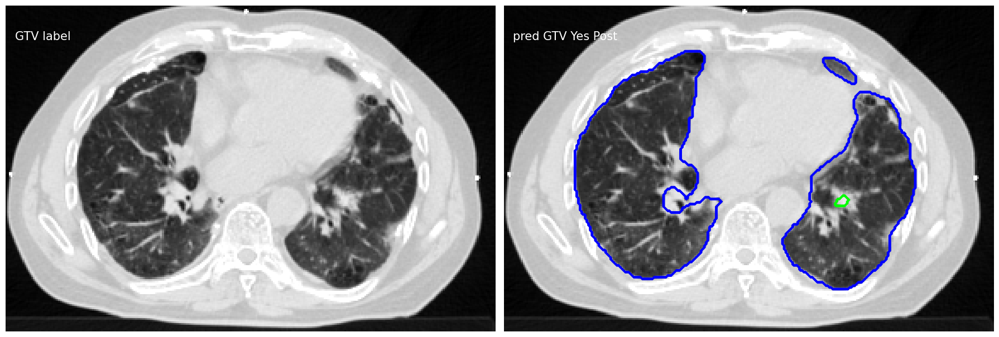

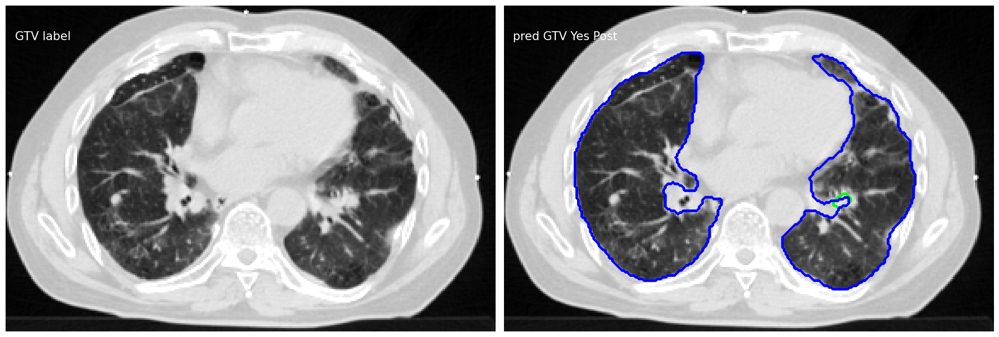

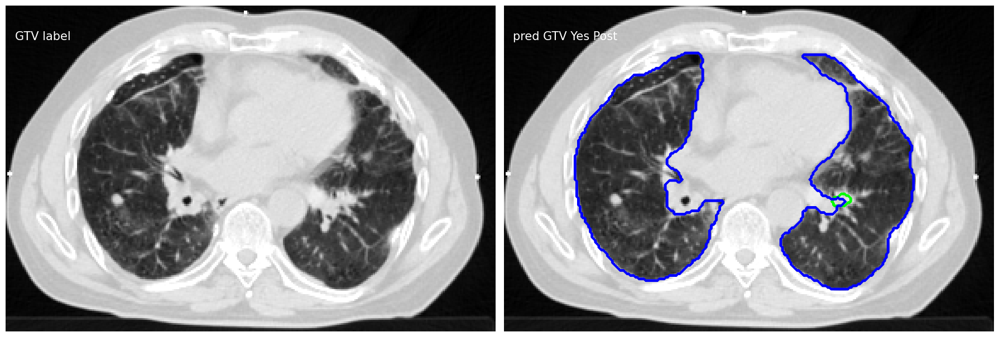

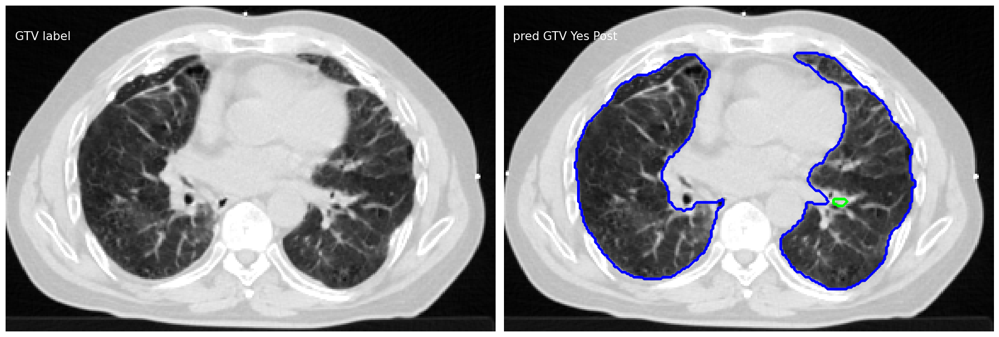

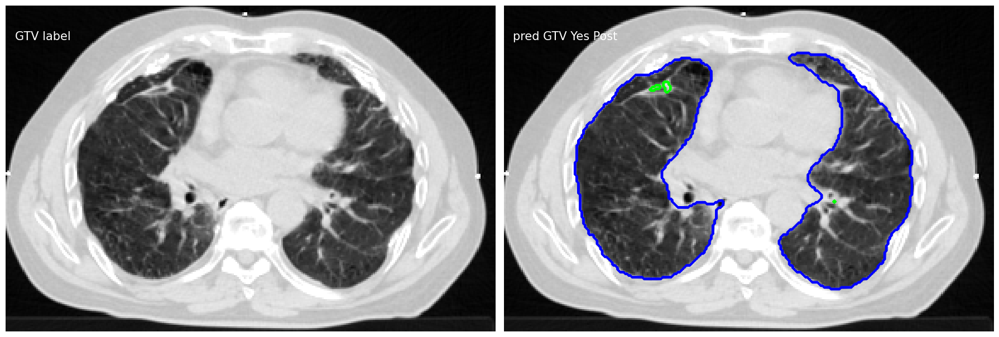

...

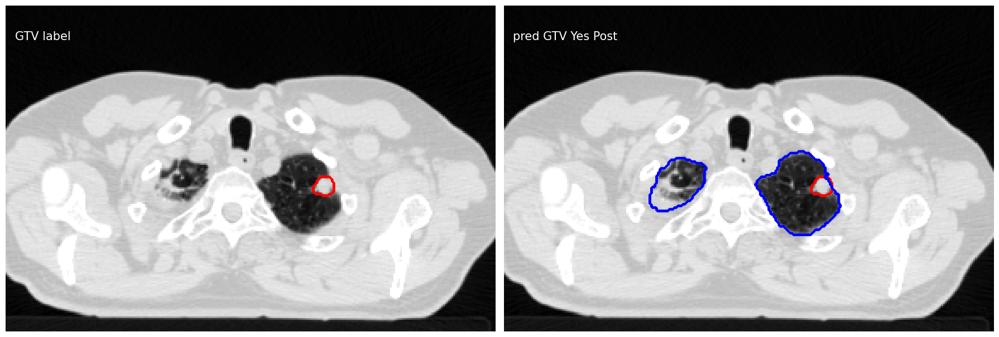

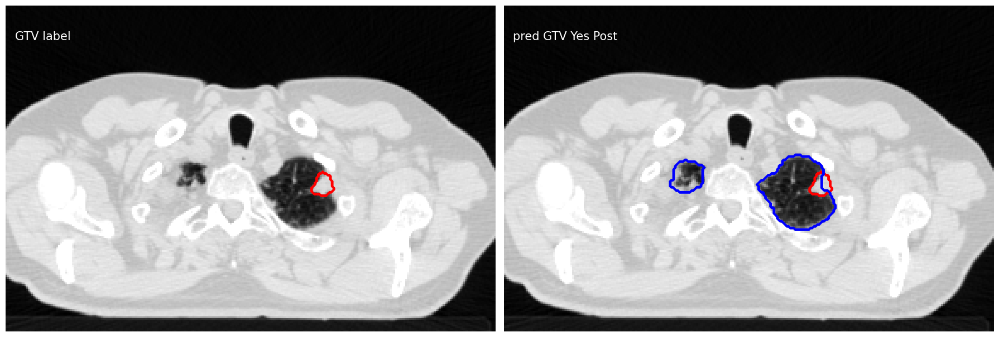

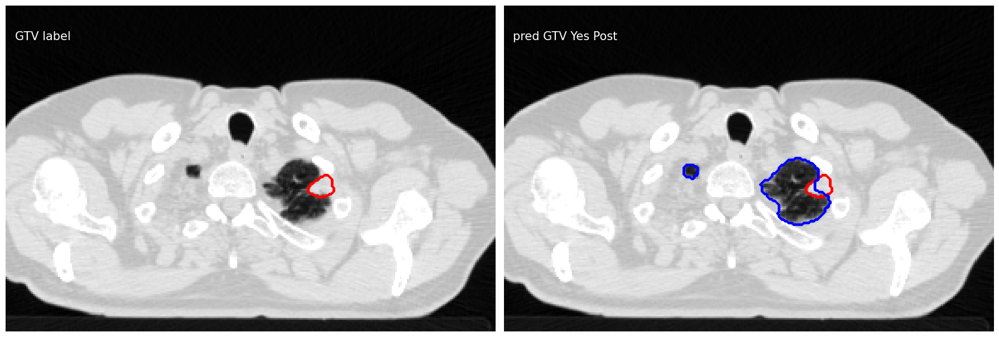

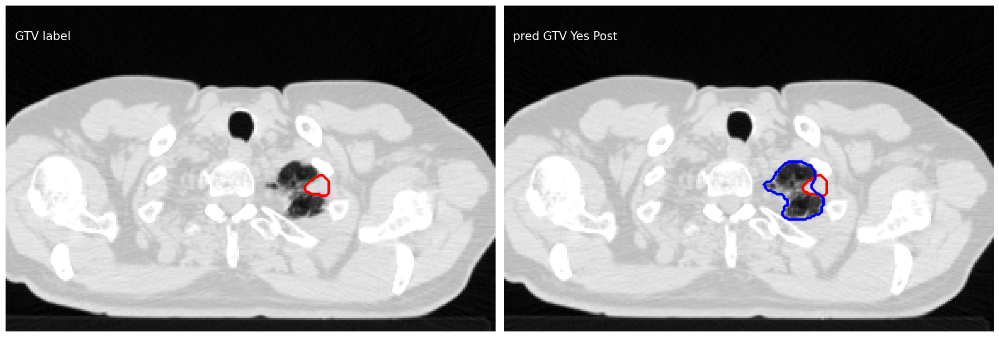

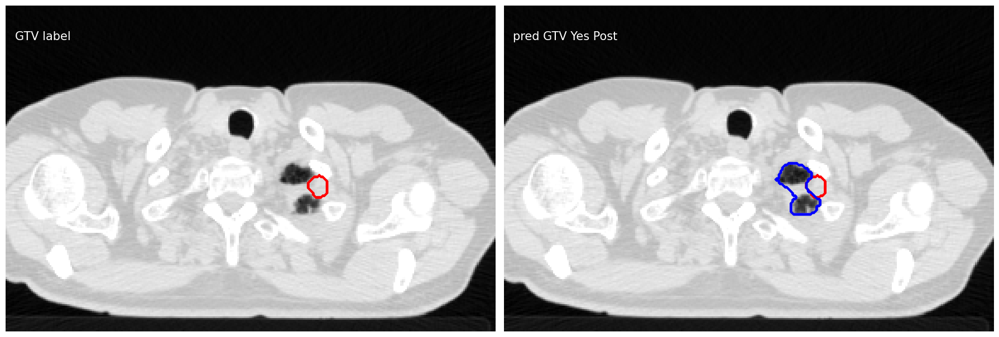

SAGITAL


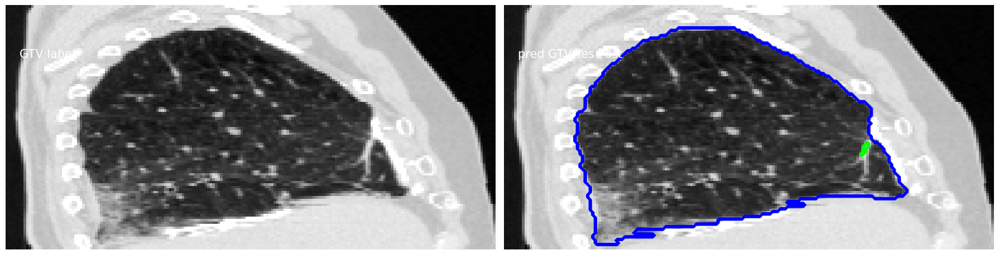

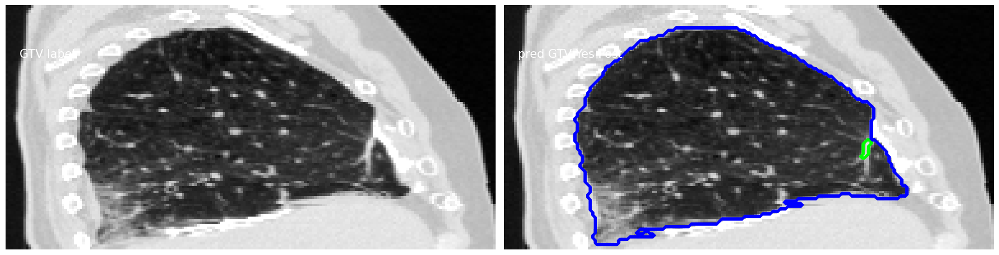

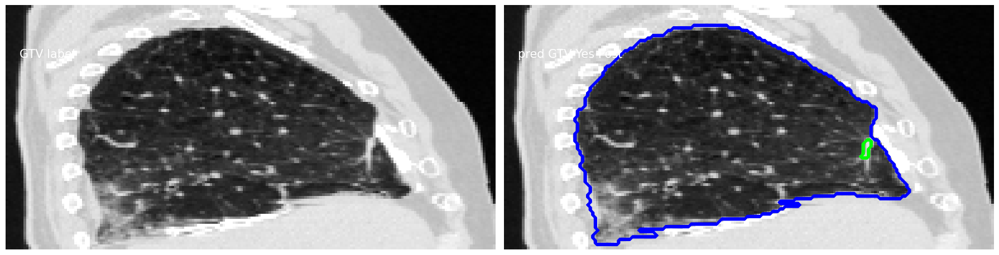

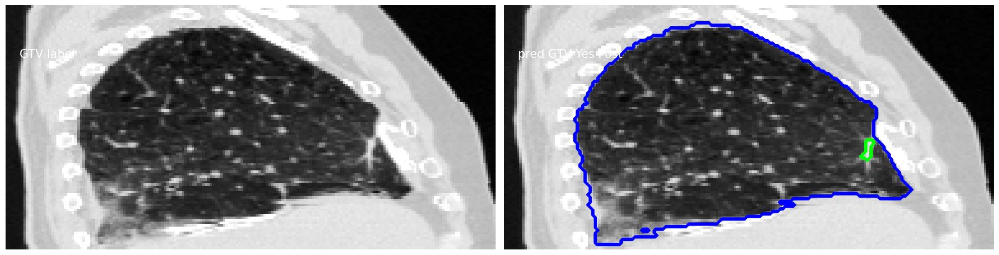

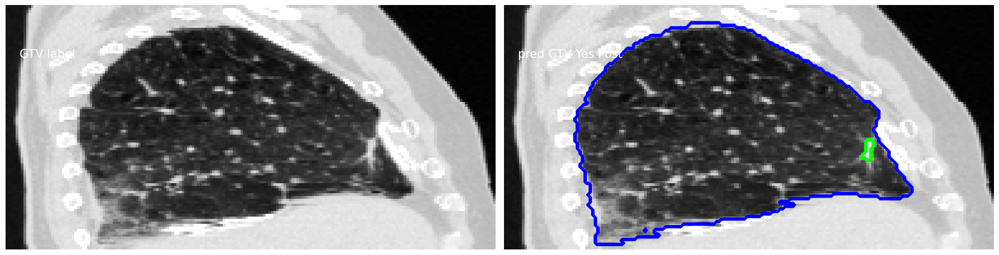

...

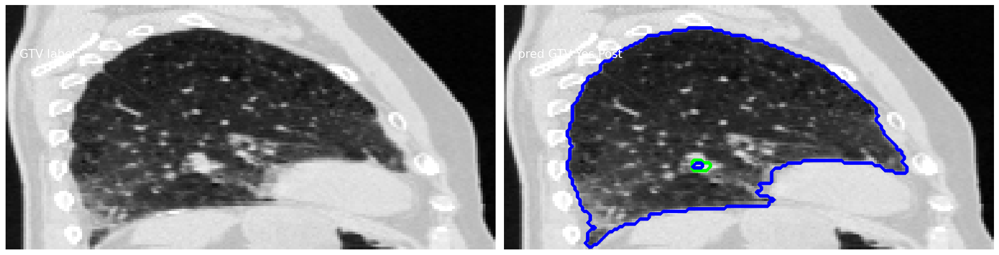

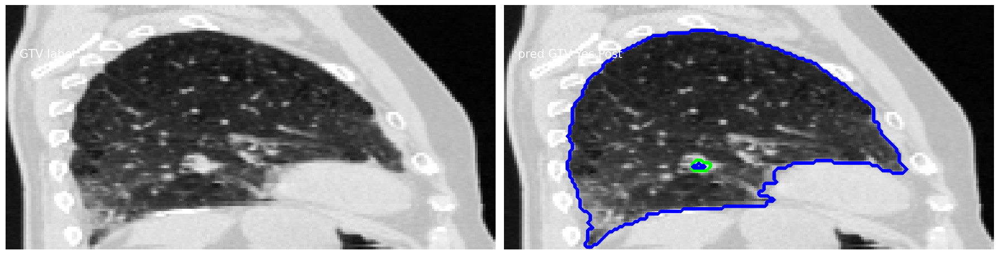

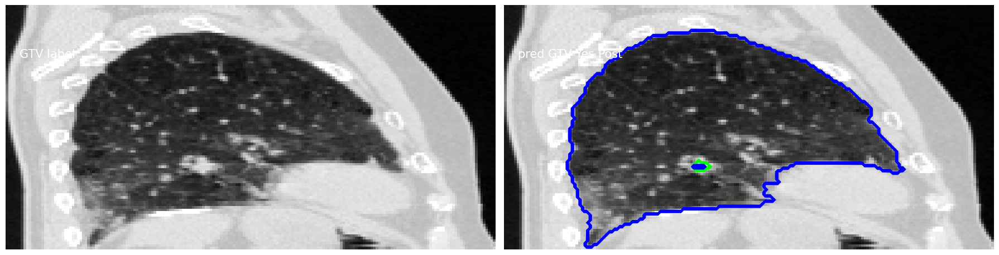

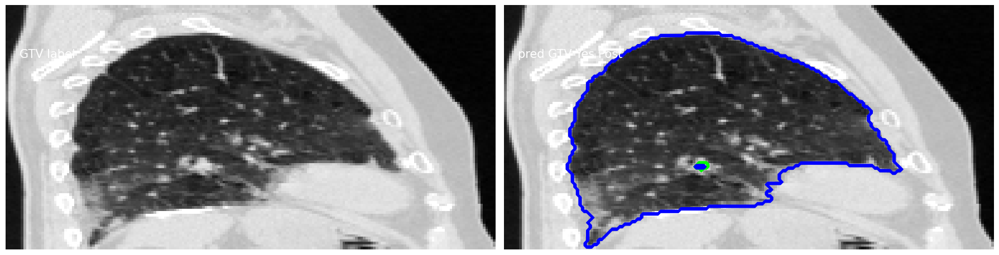

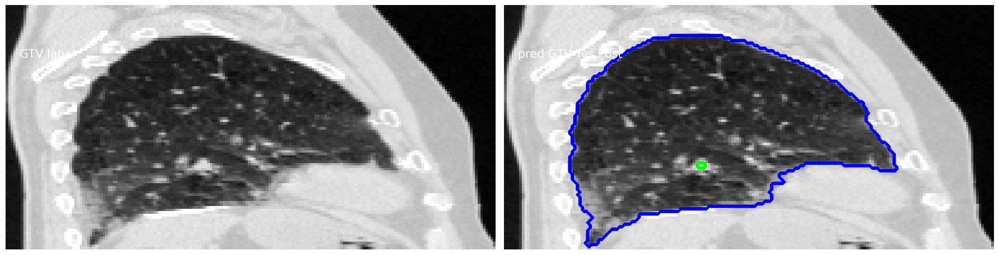

Coronal


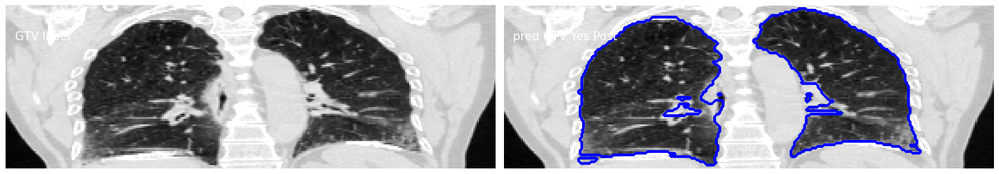

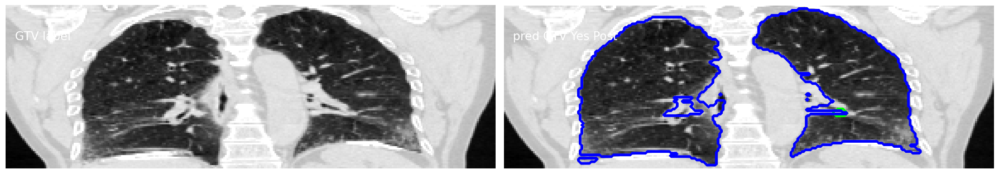

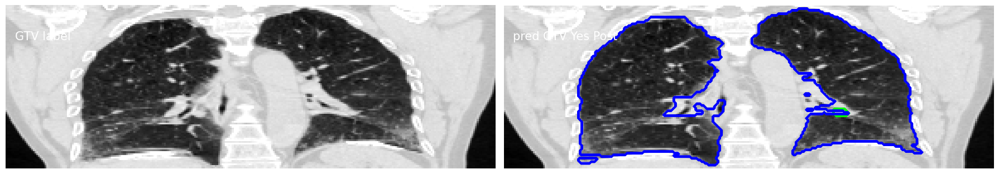

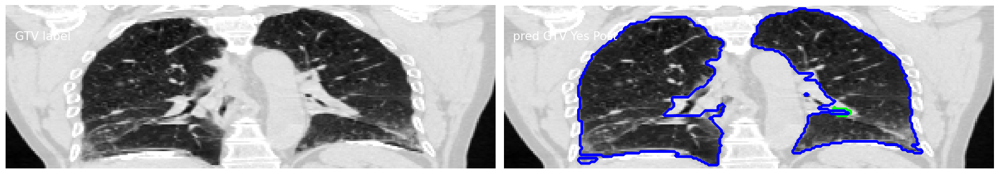

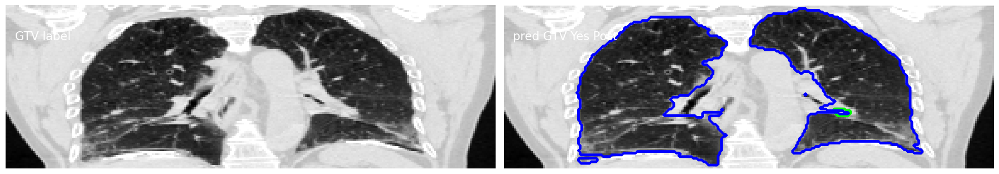

...

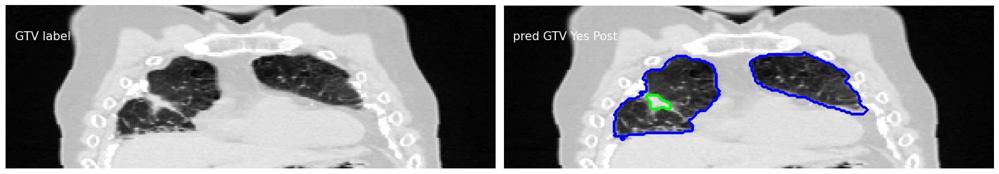

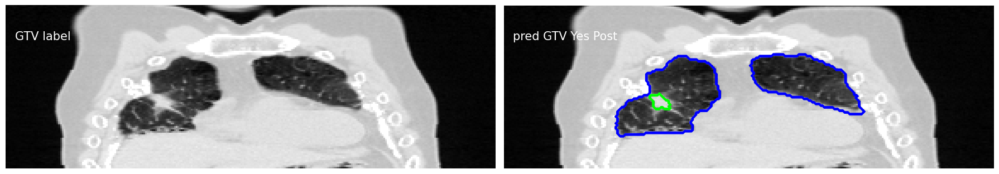

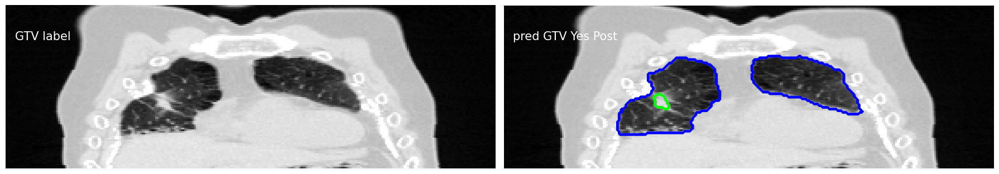

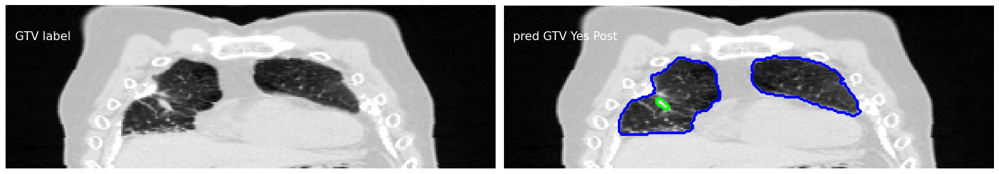

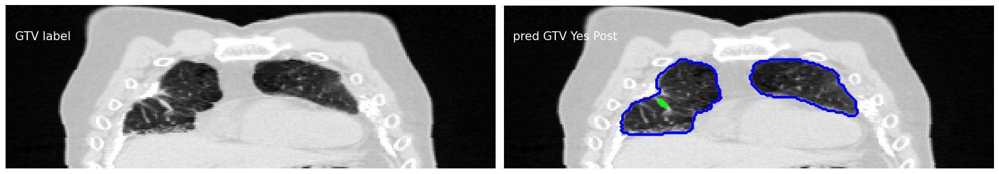

0

In [71]:
cmap = 'gray'
axial = True
sagital = True
coronal = True

lung_bool = True
itv_bool = False
gtv_bool = True
Withlabel = True
Overlap = True

custom_plot(px,cmap,axial,sagital,coronal,itv_bool,gtv_bool,Withlabel,Overlap,lung_bool)

In [9]:
def custom_plot(px,cmap,axial,sagital,coronal,itvbool,gtvbool,Withlabel,Overlap,lung_bool):
    figsize = (18, 9)
    print("Px:", px)
    count = 0
    if axial:
        for i in range(GTV.shape[-1]):
            if torch.sum(GTV[:,:,i])>0 or torch.sum(Pred[:,:,i])>0:
                count+=1
                fig = plt.figure('Instance = {}'.format(0), figsize=figsize)
                warnings.filterwarnings("ignore")
                ax = fig.add_subplot(121)
                ax.imshow(np.rot90(image[:,:, i]),cmap='gray'),plt.axis('off')
                if Withlabel:
                    if itvbool:
                        ax.contour(np.rot90(label_ITV[:,:,i]),colors='yellow')
                        ax.text(5, 10, ['ITV Label',i], style='normal',color='white',fontsize=15)
                    if gtvbool:
                        ax.contour(np.rot90(GTV[:,:,i]),colors='red')
                        ax.text(5, 20, 'GTV label', style='normal',color='white',fontsize=15)
                
                ax = fig.add_subplot(122)
                ax.imshow(np.rot90(image[:,:, i]),cmap=cmap),plt.axis('off')
                if itvbool:
                    ax.contour(np.rot90(pITV_yes[:,:,i]),colors='cyan')
                    ax.text(5, 10, 'pred ITV Yes Post', style='normal',color='white',fontsize=15)
                if gtvbool:
                    ax.contour(np.rot90(Pred[:,:,i]),colors='lime')
                    ax.text(5, 20, 'pred GTV Yes Post', style='normal',color='white',fontsize=15)
                if Overlap:
                    if itvbool:
                        ax.contour(np.rot90(label_ITV[:,:,i]),colors='yellow')
                    if gtvbool:
                        ax.contour(np.rot90(GTV[:,:,i]),colors='red')
                if lung_bool:
                    ax.contour(np.rot90(lung[:,:,i]),colors='blue')
                
                plt.tight_layout(),plt.show()
                
    if sagital:
        print("SAGITAL")
        for i in range(GTV.shape[0]):
            if torch.sum(GTV[i,:,:])>0 or torch.sum(Pred[i,:,:])>0:
                count+=1
                fig = plt.figure('Instance = {}'.format(0), figsize=figsize)
                ax = fig.add_subplot(121)
                ax.imshow(np.rot90(image[i,:,:]),cmap='gray'),plt.axis('off')
                if Withlabel:
                    if itv_bool:
                        ax.contour(np.rot90(label_ITV[i,:,:]),colors='yellow')
                        ax.text(5, 10, ['ITV Label',i], style='normal',color='white',fontsize=15)
                    if gtv_bool:
                        ax.contour(np.rot90(GTV[i,:,:]),colors='red')
                        ax.text(5, 20, 'GTV label', style='normal',color='white',fontsize=15)
                        
                
                ax = fig.add_subplot(122)
                ax.imshow(np.rot90(image[i,:,:]),cmap=cmap),plt.axis('off')
                if itvbool:
                    ax.contour(np.rot90(pITV_yes[i,:,:]),colors='cyan')
                    ax.text(5, 10, 'pred ITV Yes Post', style='normal',color='white',fontsize=15)
                if gtvbool:
                    ax.contour(np.rot90(Pred[i,:,:]),colors='lime')
                    ax.text(5, 20, 'pred GTV Yes Post', style='normal',color='white',fontsize=15)
                if Overlap:
                    if itvbool:
                        ax.contour(np.rot90(label_ITV[i,:,:]),colors='yellow')
                    if gtvbool:
                        ax.contour(np.rot90(GTV[i,:,:]),colors='red')
                if lung_bool:
                    ax.contour(np.rot90(lung[i,:,:]),colors='blue')
                    
                plt.tight_layout(),plt.show()
                
    if coronal:
        print("Coronal")
        for i in range(GTV.shape[1]):
            if torch.sum(GTV[:,i,:])>0 or torch.sum(Pred[:,i,:])>0:
                count+=1
                fig = plt.figure('Instance = {}'.format(0), figsize=figsize)
                ax = fig.add_subplot(121)
                ax.imshow(np.rot90(image[:,i,:]),cmap='gray'),plt.axis('off')
                if Withlabel:
                    if itvbool:
                        ax.contour(np.rot90(label_ITV[:,i,:]),colors='yellow')
                        ax.text(5, 10, ['ITV Label',i], style='normal',color='white',fontsize=15)
                    if gtvbool:
                            ax.contour(np.rot90(GTV[:,i,:]),colors='red')
                            ax.text(5, 20, 'GTV label', style='normal',color='white',fontsize=15)
                
                
                ax = fig.add_subplot(122)
                ax.imshow(np.rot90(image[:,i,:]),cmap=cmap),plt.axis('off')
                if itvbool:
                    ax.contour(np.rot90(pITV_yes[:,i,:]),colors='cyan')
                    ax.text(5, 10, 'pred ITV Yes Post', style='normal',color='white',fontsize=15)
                if gtvbool:
                    ax.contour(np.rot90(Pred[:,i,:]),colors='lime')
                    ax.text(5, 20, 'pred GTV Yes Post', style='normal',color='white',fontsize=15)
                if Overlap:
                    if itvbool:
                        ax.contour(np.rot90(label_ITV[:,i,:]),colors='yellow')
                    if gtvbool:
                        ax.contour(np.rot90(GTV[:,i,:]),colors='red')
                if lung_bool:
                    ax.contour(np.rot90(lung[:,i,:]),colors='blue')
               
                plt.tight_layout(),plt.show()
    return 0